Map of POI for hazard comparison

plot [WARNING]: 0.5p, not a valid number and may not be decoded properly.


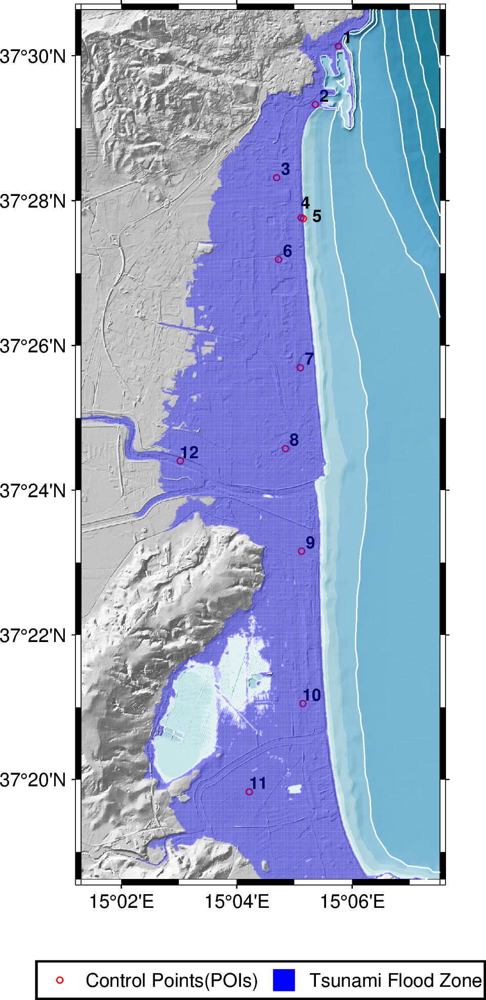

In [1]:
import os
import sys
os.environ['MPLCONFIGDIR'] = os.getcwd() + "/configs/"
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pygmt
import pyogrio
pyogrio.core._register_drivers()

MLDir = os.getenv('MLDir')
SimDir = os.getenv('SimDir')
reg = 'CT'
train_size = '1658'
mask_size = '892'

eve_id = np.loadtxt(f'{MLDir}/data/events/sample_events53550.txt',dtype='str')   
#inundation attributes
flood_mask = ~np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
nflood_grids = np.count_nonzero(flood_mask)
zero_mask = np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
index_map = pd.read_csv(f'{MLDir}/data/processed/lat_lon_idx_{reg}_{mask_size}.txt',sep=',',header=None)
index_map.columns = ['m','n','lat','lon'] #add column names

GaugeNo = list(range(35,44)) #for Catania
columnname = str(38)
x_dim = 912
y_dim = 2224
ts_dim = len(GaugeNo)
pts_dim = 480
list_size = ['892','1658','3454','7071'] 
control_points =  [[37.5022,15.0960],
    [37.48876,15.08936],
    [37.47193,15.07816],
    [37.46273,15.08527],
    [37.46252,15.08587],
    [37.45312,15.07874],
    [37.42821,15.08506],
    [37.40958,15.08075],
    [37.38595,15.08539],
    [37.35084,15.08575],
    [37.33049,15.07029],
    [37.40675,15.05037]]

# Load the elevation from netcdf grid
grid = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
ymin = grid['y'].min().values
ymax = grid['y'].max().values
xmin = grid['x'].min().values
xmax = grid['x'].max().values
cptfile_bathy = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy_error.cpt'  

#plot the buildings based on IDAG as residential, industrial and commercial
fig = pygmt.Figure()
cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame=True)
fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')


#plot control POIs and annotate
for i in range(len(control_points)-1):
    fig.plot(x=control_points[i][1],y=control_points[i][0],pen='0.5p,red',style='c0.1c')
    if i == 3:
        fig.text(x=control_points[i][1],y=control_points[i][0],text=f'{i+1}',offset='0.15c',font='8p,Helvetica-Bold,black',justify='BR')
    elif i == 4:
        fig.text(x=control_points[i][1],y=control_points[i][0],text=f'{i+1}',offset='0.15c',font='8p,Helvetica-Bold,black',justify='TL')
    else:
        fig.text(x=control_points[i][1],y=control_points[i][0],text=f'{i+1}',offset='0.15c',font='8p,Helvetica-Bold,black')

#plot the last one with label
fig.plot(x=control_points[-1][1],y=control_points[-1][0],pen='0.5p,red',style='c0.1c',label='Control Points(POIs)+N2')
fig.text(x=control_points[-1][1],y=control_points[-1][0],text=f'{len(control_points)}',offset='0.15c',font='8p,Helvetica-Bold,black')

# plot flood zone mask
fig.plot(x=index_map['lon'],y=index_map['lat'],style='s0.01c',pen='blue',transparency=95) 
flood_mask_symbol = fig.plot(x=0,y=0,label='Tsunami Flood Zone',style='s0.5p,',pen='blue',fill='blue',transparency=95)

# plot legend below the map
fig.legend(position='jBC+o0c/-2c+w7.5c',box='+gwhite+p1p')
fig.savefig(f'{MLDir}/risk/plots/Map_POIs.png') 
fig.show()


Map the building footprint for Catania

/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCop

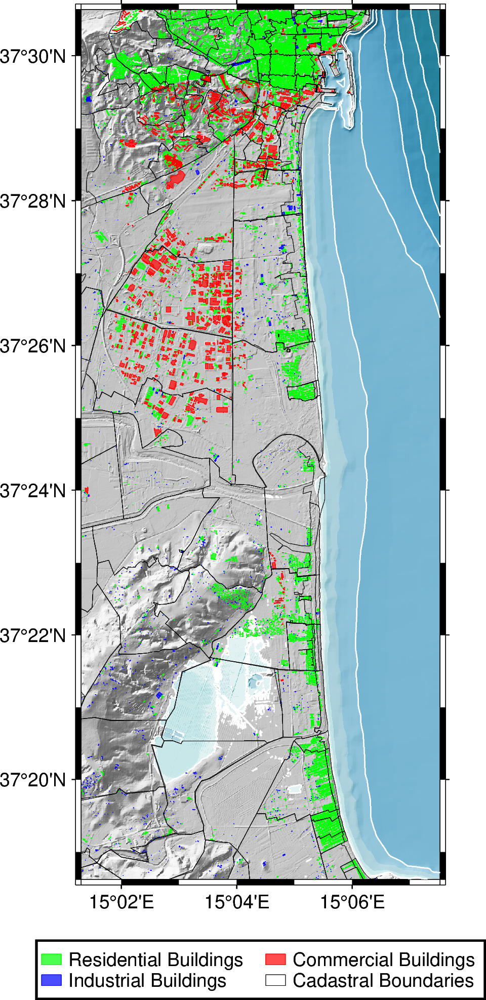

In [1]:
import os
import sys
os.environ['MPLCONFIGDIR'] = os.getcwd() + "/configs/"
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pygmt
import pyogrio
pyogrio.core._register_drivers()

MLDir = os.getenv('MLDir')
SimDir = os.getenv('SimDir')
reg = 'CT'
train_size = '1658'
mask_size = '892'

eve_id = np.loadtxt(f'{MLDir}/data/events/sample_events53550.txt',dtype='str')   
#inundation attributes
flood_mask = ~np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
nflood_grids = np.count_nonzero(flood_mask)
zero_mask = np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
index_map = pd.read_csv(f'{MLDir}/data/processed/lat_lon_idx_{reg}_{mask_size}.txt',sep=',',header=None)
index_map.columns = ['m','n','lat','lon'] #add column names

GaugeNo = list(range(35,44)) #for Catania
columnname = str(38)
x_dim = 912
y_dim = 2224
ts_dim = len(GaugeNo)
pts_dim = 480
list_size = ['892','1658','3454','7071'] 
control_points =  [[37.5022,15.0960],
    [37.48876,15.08936],
    [37.47193,15.07816],
    [37.46273,15.08527],
    [37.46252,15.08587],
    [37.45312,15.07874],
    [37.42821,15.08506],
    [37.40958,15.08075],
    [37.38595,15.08539],
    [37.35084,15.08575],
    [37.33049,15.07029],
    [37.40675,15.05037]]

# Load the elevation from netcdf grid
grid = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
ymin = grid['y'].min().values
ymax = grid['y'].max().values
xmin = grid['x'].min().values
xmax = grid['x'].max().values
cptfile_bathy = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy_error.cpt'  

#read geopackage file with building polygons
file_path = f'{MLDir}/risk/exposure/CT_Building_Footprint.gpkg'
buildings_footprint = gpd.read_file(file_path,  layer='Building_Footprint')
buildings_attributes = gpd.read_file(file_path,  layer='Building_Attributes')
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')

#list IDAG which are residential buildings
R_IDAG = buildings_exposure[buildings_exposure['Occupancy'] == 'R']['IDAG'].values
I_IDAG = buildings_exposure[buildings_exposure['Occupancy'] == 'I']['IDAG'].values
C_IDAG = buildings_exposure[buildings_exposure['Occupancy'] == 'C']['IDAG'].values

#read shapefile with admin boundaries
cadastral_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_cadastral.shp'
commune_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_commune.shp'
cadastral_values = pd.read_csv(f'{MLDir}/risk/exposure/Admin_units/foglio_values.csv')
cadastral_values.columns = ['FID','Value']
cadastral = gpd.read_file(cadastral_path)
cadastral = cadastral.merge(cadastral_values, on='FID')
commune = gpd.read_file(commune_path)

#plot the buildings based on IDAG as residential, industrial and commercial
fig = pygmt.Figure()
cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame=True)
fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(R_IDAG)],
         pen="0.1p,green",
         fill="green@30",
         label="Residential Buildings+N2")
fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(C_IDAG)],
            pen="0.1p,red",
            fill="red@30",
            label="Commercial Buildings")
fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(I_IDAG)],
         pen="0.1p,blue",
         fill="blue@30",
         label="Industrial Buildings")

fig.plot(data=cadastral,
         pen="0.1p,black",
         label="Cadastral Boundaries")

#plot legend below the map
fig.legend(position='jBC+o0c/-2c+w7.5c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Buildings.png') 
fig.show()


/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCop

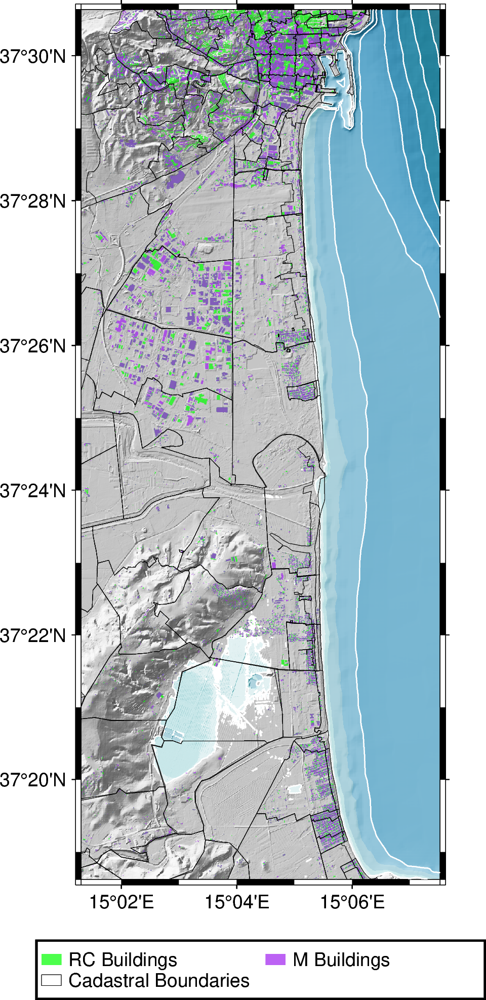

In [6]:
import os
import sys
os.environ['MPLCONFIGDIR'] = os.getcwd() + "/configs/"
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pygmt
import pyogrio
pyogrio.core._register_drivers()

MLDir = os.getenv('MLDir')
SimDir = os.getenv('SimDir')
reg = 'CT'
train_size = '1658'
mask_size = '892'

eve_id = np.loadtxt(f'{MLDir}/data/events/sample_events53550.txt',dtype='str')   
#inundation attributes
flood_mask = ~np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
nflood_grids = np.count_nonzero(flood_mask)
zero_mask = np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
index_map = pd.read_csv(f'{MLDir}/data/processed/lat_lon_idx_{reg}_{mask_size}.txt',sep=',',header=None)
index_map.columns = ['m','n','lat','lon'] #add column names

GaugeNo = list(range(35,44)) #for Catania
columnname = str(38)
x_dim = 912
y_dim = 2224
ts_dim = len(GaugeNo)
pts_dim = 480
list_size = ['892','1658','3454','7071'] 
control_points =  [[37.5022,15.0960],
    [37.48876,15.08936],
    [37.47193,15.07816],
    [37.46273,15.08527],
    [37.46252,15.08587],
    [37.45312,15.07874],
    [37.42821,15.08506],
    [37.40958,15.08075],
    [37.38595,15.08539],
    [37.35084,15.08575],
    [37.33049,15.07029],
    [37.40675,15.05037]]

# Load the elevation from netcdf grid
grid = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
ymin = grid['y'].min().values
ymax = grid['y'].max().values
xmin = grid['x'].min().values
xmax = grid['x'].max().values
cptfile_bathy = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy_error.cpt'  

#read geopackage file with building polygons
file_path = f'{MLDir}/risk/exposure/CT_Building_Footprint.gpkg'
buildings_footprint = gpd.read_file(file_path,  layer='Building_Footprint')
buildings_attributes = gpd.read_file(file_path,  layer='Building_Attributes')
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')

#list IDAG which are residential buildings
RC_IDAG = buildings_exposure[buildings_exposure['Construction'] == 'RC']['IDAG'].values
M_IDAG = buildings_exposure[buildings_exposure['Construction'] == 'M']['IDAG'].values


#read shapefile with admin boundaries
cadastral_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_cadastral.shp'
commune_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_commune.shp'
cadastral_values = pd.read_csv(f'{MLDir}/risk/exposure/Admin_units/foglio_values.csv')
cadastral_values.columns = ['FID','Value']
cadastral = gpd.read_file(cadastral_path)
cadastral = cadastral.merge(cadastral_values, on='FID')
commune = gpd.read_file(commune_path)

#plot the buildings based on IDAG as residential, industrial and commercial
fig = pygmt.Figure()
cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame=True)
fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(RC_IDAG)],
         pen=None,
         fill="green@30",
         label="RC Buildings+N2")

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(M_IDAG)],
            pen=None,
            fill="purple@30",
            label="M Buildings")

fig.plot(data=cadastral,
         pen="0.1p,black",
         label="Cadastral Boundaries")

#plot legend below the map
fig.legend(position='jBC+o0c/-2c+w7.5c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Buildings_Construction.png') 
fig.show()


/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCop

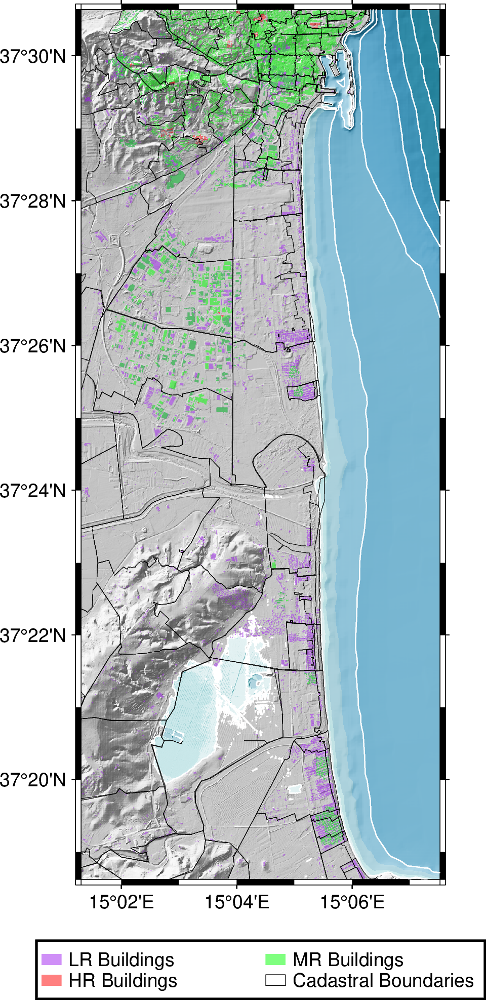

In [9]:
import os
import sys
os.environ['MPLCONFIGDIR'] = os.getcwd() + "/configs/"
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pygmt
import pyogrio
pyogrio.core._register_drivers()

MLDir = os.getenv('MLDir')
SimDir = os.getenv('SimDir')
reg = 'CT'
train_size = '1658'
mask_size = '892'

eve_id = np.loadtxt(f'{MLDir}/data/events/sample_events53550.txt',dtype='str')   
#inundation attributes
flood_mask = ~np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
nflood_grids = np.count_nonzero(flood_mask)
zero_mask = np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
index_map = pd.read_csv(f'{MLDir}/data/processed/lat_lon_idx_{reg}_{mask_size}.txt',sep=',',header=None)
index_map.columns = ['m','n','lat','lon'] #add column names

GaugeNo = list(range(35,44)) #for Catania
columnname = str(38)
x_dim = 912
y_dim = 2224
ts_dim = len(GaugeNo)
pts_dim = 480
list_size = ['892','1658','3454','7071'] 
control_points =  [[37.5022,15.0960],
    [37.48876,15.08936],
    [37.47193,15.07816],
    [37.46273,15.08527],
    [37.46252,15.08587],
    [37.45312,15.07874],
    [37.42821,15.08506],
    [37.40958,15.08075],
    [37.38595,15.08539],
    [37.35084,15.08575],
    [37.33049,15.07029],
    [37.40675,15.05037]]

# Load the elevation from netcdf grid
grid = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
ymin = grid['y'].min().values
ymax = grid['y'].max().values
xmin = grid['x'].min().values
xmax = grid['x'].max().values
cptfile_bathy = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy_error.cpt'  

#read geopackage file with building polygons
file_path = f'{MLDir}/risk/exposure/CT_Building_Footprint.gpkg'
buildings_footprint = gpd.read_file(file_path,  layer='Building_Footprint')
buildings_attributes = gpd.read_file(file_path,  layer='Building_Attributes')
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')

#list IDAG which are residential buildings
LR_IDAG = buildings_exposure[buildings_exposure['FloorType'] == 'LR']['IDAG'].values
MR_IDAG = buildings_exposure[buildings_exposure['FloorType'] == 'MR']['IDAG'].values
HR_IDAG = buildings_exposure[buildings_exposure['FloorType'] == 'HR']['IDAG'].values

#read shapefile with admin boundaries
cadastral_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_cadastral.shp'
commune_path = f'{MLDir}/risk/exposure/Admin_units/Sicilia_commune.shp'
cadastral_values = pd.read_csv(f'{MLDir}/risk/exposure/Admin_units/foglio_values.csv')
cadastral_values.columns = ['FID','Value']
cadastral = gpd.read_file(cadastral_path)
cadastral = cadastral.merge(cadastral_values, on='FID')
commune = gpd.read_file(commune_path)

#plot the buildings based on IDAG as residential, industrial and commercial
fig = pygmt.Figure()
cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame=True)
fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(LR_IDAG)],
         pen=None,
         fill="purple@50",
         label="LR Buildings+N2")

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(MR_IDAG)],
            pen=None,
            fill="green@50",
            label="MR Buildings")

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(HR_IDAG)],
            pen=None,
            fill="red@50",
            label="HR Buildings")

fig.plot(data=cadastral,
         pen="0.1p,black",
         label="Cadastral Boundaries")

#plot legend below the map
fig.legend(position='jBC+o0c/-2c+w7.5c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Buildings_Frame.png') 
fig.show()


/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/home/naveen.raguramalinga/opt/miniconda3/envs/pygmt/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCop

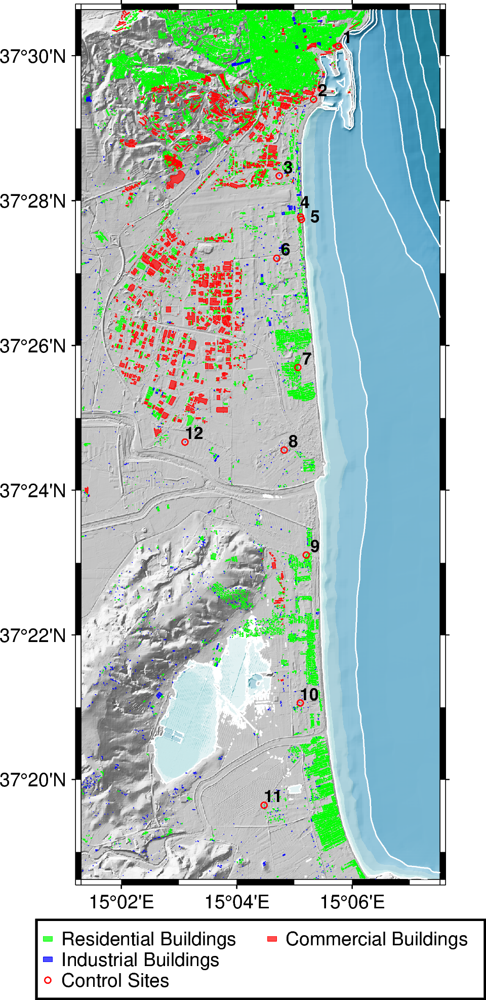

In [8]:
import os
import sys
os.environ['MPLCONFIGDIR'] = os.getcwd() + "/configs/"
import geopandas as gpd
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import pygmt
import pyogrio
pyogrio.core._register_drivers()

MLDir = os.getenv('MLDir')
SimDir = os.getenv('SimDir')
reg = 'CT'
train_size = '1658'
mask_size = '892'

eve_id = np.loadtxt(f'{MLDir}/data/events/sample_events53550.txt',dtype='str')   
#inundation attributes
flood_mask = ~np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
nflood_grids = np.count_nonzero(flood_mask)
zero_mask = np.load(f'{MLDir}/data/processed/zero_mask_{reg}_{mask_size}.npy')
index_map = pd.read_csv(f'{MLDir}/data/processed/lat_lon_idx_{reg}_{mask_size}.txt',sep=',',header=None)
index_map.columns = ['m','n','lat','lon'] #add column names

GaugeNo = list(range(35,44)) #for Catania
columnname = str(38)
x_dim = 912
y_dim = 2224
ts_dim = len(GaugeNo)
pts_dim = 480
list_size = ['892','1658','3454','7071'] 
control_points =  [[37.5022,15.0960],
    [37.48876,15.08936],
    [37.47193,15.07816],
    [37.46273,15.08527],
    [37.46252,15.08587],
    [37.45312,15.07874],
    [37.42821,15.08506],
    [37.40958,15.08075],
    [37.38595,15.08539],
    [37.35084,15.08575],
    [37.33049,15.07029],
    [37.40675,15.05037]]

# Load the elevation from netcdf grid
grid = xr.open_dataset('../../data/processed/CT_defbathy.nc',engine='netcdf4')
ymin = grid['y'].min().values
ymax = grid['y'].max().values
xmin = grid['x'].min().values
xmax = grid['x'].max().values
cptfile_bathy = '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/scripts/PaperIIPlots/PaperI/r2/bathy_error.cpt'  

#plot the buildings based on IDAG as residential, industrial and commercial
fig = pygmt.Figure()
cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame=True)
fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')

fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(R_IDAG)],
         pen="0.1p,green",
         fill="green@30",
         label="Residential Buildings+N2")
fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(C_IDAG)],
            pen="0.1p,red",
            fill="red@30",
            label="Commercial Buildings")
fig.plot(data=buildings_footprint[buildings_footprint['IDAG'].isin(I_IDAG)],
         pen="0.1p,blue",
         fill="blue@30",
         label="Industrial Buildings")

control_points = pd.read_csv(f'{MLDir}/risk/plots/Control_POI.csv')

fig.plot(x=control_points['nearest_x'],y=control_points['nearest_y'],pen='0.5p,red',style='c0.1c',label='Control Sites+N2')
#annotate
for i in range(len(control_points)):
    if i == 3:
        fig.text(x=control_points['nearest_x'][i],y=control_points['nearest_y'][i],text=f'{i+1}',offset='0.15c',font='8p,Helvetica-Bold,black',justify='BR')
    elif i == 4:
        fig.text(x=control_points['nearest_x'][i],y=control_points['nearest_y'][i],text=f'{i+1}',offset='0.15c',font='8p,Helvetica-Bold,black',justify='TL')
    else:
        fig.text(x=control_points['nearest_x'][i],y=control_points['nearest_y'][i],text=f'{i+1}',offset='0.15c',font='8p,Helvetica-Bold,black')

# plot legend below the map
fig.legend(position='jBC+o0c/-2c+w7.5c',box='+gwhite+p1p')
fig.savefig(f'{MLDir}/risk/plots/Map_POIs_risk.png') 
fig.show()


In [ ]:
# # cadastral['Value'] = cadastral['Value']/10e6

# pygmt.makecpt(cmap="hot",
#               series=[0,10,1],
#               continuous=False,
#               reverse=True,
#               output="simple.cpt")

# splits = cadastral['Value'].quantile([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
# splits

Show commune and cadastral foglio limits

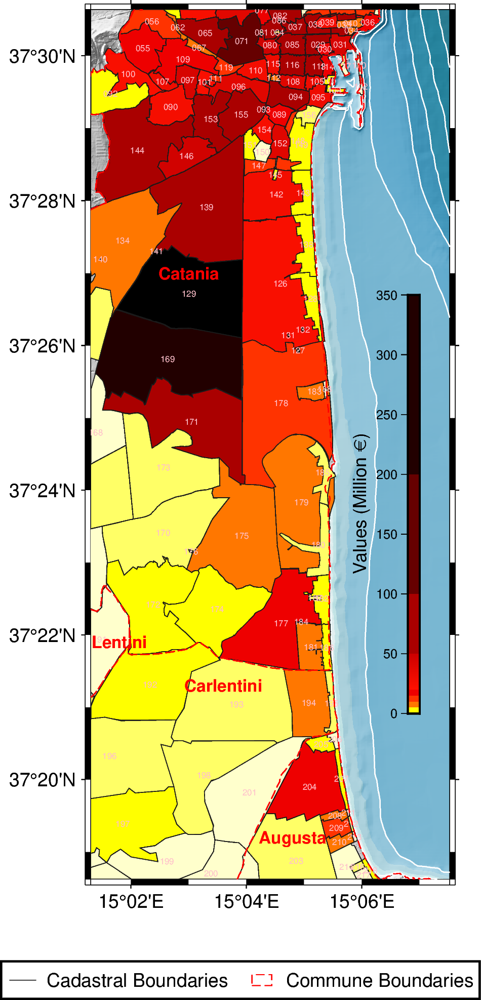

In [ ]:

#plot the cadastral boundaries
fig = pygmt.Figure()
cmap = pygmt.makecpt(cmap=cptfile_bathy,continuous=False)
fig.grdimage(grid['z'], cmap=True, shading=True,region=[xmin,xmax,ymin,ymax],projection='M6c',frame=True)
fig.grdcontour(grid['z'], levels=10, pen='0.5p,white', limit=[-100, 0],projection='M6c')


cptfile = f'{MLDir}/risk/plots/cadastral_10.cpt'
cmap = pygmt.makecpt(cmap=cptfile,continuous=False)

# pygmt.makecpt(cmap="hot",series=[cadastral['Value'].min(),cadastral['Value'].max(),(cadastral['Value'].max()-cadastral['Value'].min())/10],continuous=True,reverse=True,output="simple_cad.cpt")
fig.plot(data=cadastral,
        pen="0.3p,gray10",
        fill="+z",
        cmap=True,
        aspatial="Z=Value",
        label="Cadastral Boundaries+N2")


# add annotation for the cadastral boundaries
for idx, row in cadastral.iterrows():
    x = row.geometry.centroid.x
    y = row.geometry.centroid.y
    fig.text(x=x, y=y, text=row['FOGLIO'], font='4p,pink', justify='CM')

fig.plot(data=commune,
            pen="0.5p,red,dashed",
            label="Commune Boundaries")

#add annotation for the commune boundaries
fig.text(x=15.05, y=37.45, text='Catania', font='8p,Helvetica-Bold,red', justify='CM')
fig.text(x=15.03, y=37.365, text='Lentini',font='8p,Helvetica-Bold,red', justify='CM')
fig.text(x=15.06, y=37.355, text='Carlentini',font='8p,Helvetica-Bold,red', justify='CM')
fig.text(x=15.08, y=37.32, text='Augusta', font='8p,Helvetica-Bold,red', justify='CM')

# Add colorbar legend
fig.colorbar(frame=["x+lValue (Million €)",'a50'], position="jMR+o0.5c/-1c+w7c/0.2c")

#plot legend below the map
fig.legend(position='jBC+o-0.5c/-2c+w8c',box='+gwhite+p1p',)
fig.savefig(f'{MLDir}/risk/plots/Map_Cadastral.png')
fig.show()

Histogram on the distribution of the building exposure


Text(0.5, 0, 'Occupancy Type')

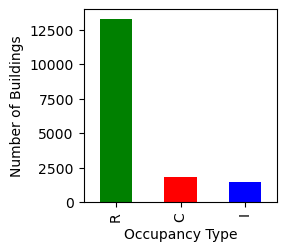

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
ax = buildings_exposure['Occupancy'].value_counts().plot(kind='bar',color=['green','red','blue'])
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Occupancy Type')

/tmp/ipykernel_3290292/1360273419.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  buildings_exposure['nFloors'][buildings_exposure['nFloors'] > 6 ] = 7
/tmp/ipykernel_3290292/1360273419.py:2: SettingWithCopyWarning: 
A value is trying to

[Text(0, 0, '1'),
 Text(1, 0, '2'),
 Text(2, 0, '3'),
 Text(3, 0, '4'),
 Text(4, 0, '5'),
 Text(5, 0, '6'),
 Text(6, 0, '7-11')]

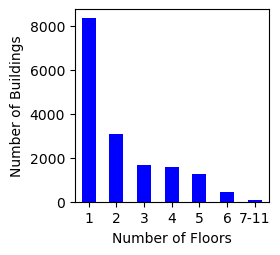

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
buildings_exposure['nFloors'][buildings_exposure['nFloors'] > 6 ] = 7
ax = buildings_exposure['nFloors'].value_counts().loc[[1,2,3,4,5,6,7]].plot(kind='bar',color='blue')
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Number of Floors')
ax.set_xticklabels(['1','2','3','4','5','6','7-11'],rotation=0)

Text(0.5, 0, 'Buidling Type')

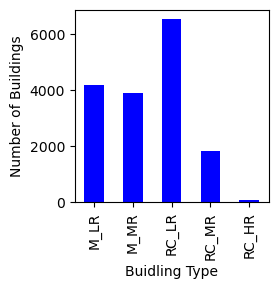

In [ ]:
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
ax = buildings_exposure['Building_Class'].value_counts().loc[['M_LR','M_MR','RC_LR','RC_MR','RC_HR']].plot(kind='bar',color='blue')
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Buidling Type')

Text(0.5, 0, 'Construction Type')

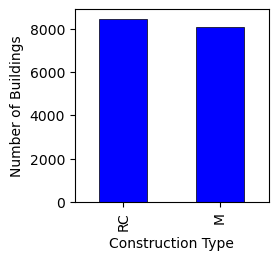

In [156]:
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
ax = buildings_exposure['Construction'].value_counts().plot(kind='bar',color='blue',edgecolor='black', linewidth=0.5)
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Construction Type')

count    16538.000000
mean         1.220211
std          2.386807
min          0.000000
25%          0.098775
50%          0.211400
75%          0.892000
max         10.000000
Name: Value, dtype: float64


/tmp/ipykernel_3290292/3611013294.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  buildings_exposure['Value'][buildings_exposure['Value'] > 10] = 10
/tmp/ipykernel_3290292/3611013294.py:3: SettingWithCopyWarning: 
A value is trying to be

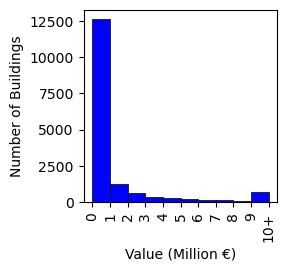

In [154]:
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')
buildings_exposure['Value'] = buildings_exposure['Value']/1e6
buildings_exposure['Value'][buildings_exposure['Value'] > 10] = 10
print(buildings_exposure['Value'].describe())

fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
ax.hist(buildings_exposure['Value'],bins=10,color='blue',edgecolor='black', linewidth=0.5)
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Value (Million €)')
ax.set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax.set_xticklabels(['0','1','2','3','4','5','6','7','8','9','10+'],rotation=90)
fig.show()

count    16538.000000
mean       281.186903
std        307.997538
min          0.000000
25%         80.000000
50%        144.000000
75%        331.000000
max       1000.000000
Name: PlinthArea, dtype: float64


/tmp/ipykernel_3290292/2233300657.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  buildings_exposure['PlinthArea'][buildings_exposure['PlinthArea'] > 1000] = 1000
/tmp/ipykernel_3290292/2233300657.py:2: SettingWithCopyWarning: 
A value i

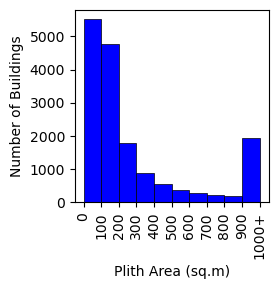

In [153]:
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')
buildings_exposure['PlinthArea'][buildings_exposure['PlinthArea'] > 1000] = 1000
print(buildings_exposure['PlinthArea'].describe())
fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
ax.hist(buildings_exposure['PlinthArea'],bins=10,color='blue',edgecolor='black', linewidth=0.5)
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Plith Area (sq.m)')
ax.set_xticks([0,100,200,300,400,500,600,700,800,900,1000])
ax.set_xticklabels(['0','100','200','300','400','500','600','700','800','900','1000+'],rotation=90)
fig.show()

count    16538.000000
mean         6.064591
std          3.453311
min         -0.441770
25%          2.795535
50%          5.057290
75%         10.000000
max         10.000000
Name: Elevation, dtype: float64


/tmp/ipykernel_3290292/3020747728.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  buildings_exposure['Elevation'][buildings_exposure['Elevation'] > 10] = 10
/tmp/ipykernel_3290292/3020747728.py:2: SettingWithCopyWarning: 
A value is tryi

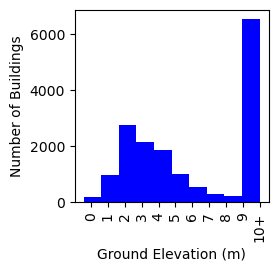

In [164]:
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')
buildings_exposure['Elevation'][buildings_exposure['Elevation'] > 10] = 10
print(buildings_exposure['Elevation'].describe())

fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
ax.hist(buildings_exposure['Elevation'],bins=10,color='blue')
ax.set_ylabel('Number of Buildings')
ax.set_xlabel('Ground Elevation (m)')
ax.set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax.set_xticklabels(['0','1','2','3','4','5','6','7','8','9','10+'],rotation=90)
fig.show()

/tmp/ipykernel_123155/1332326587.py:12: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  buildings_exposure['Value'][buildings_exposure['Value'] > 10] = 10
/tmp/ipykernel_123155/1332326587.py:12: SettingWithCopyWarning: 
A value is trying to be

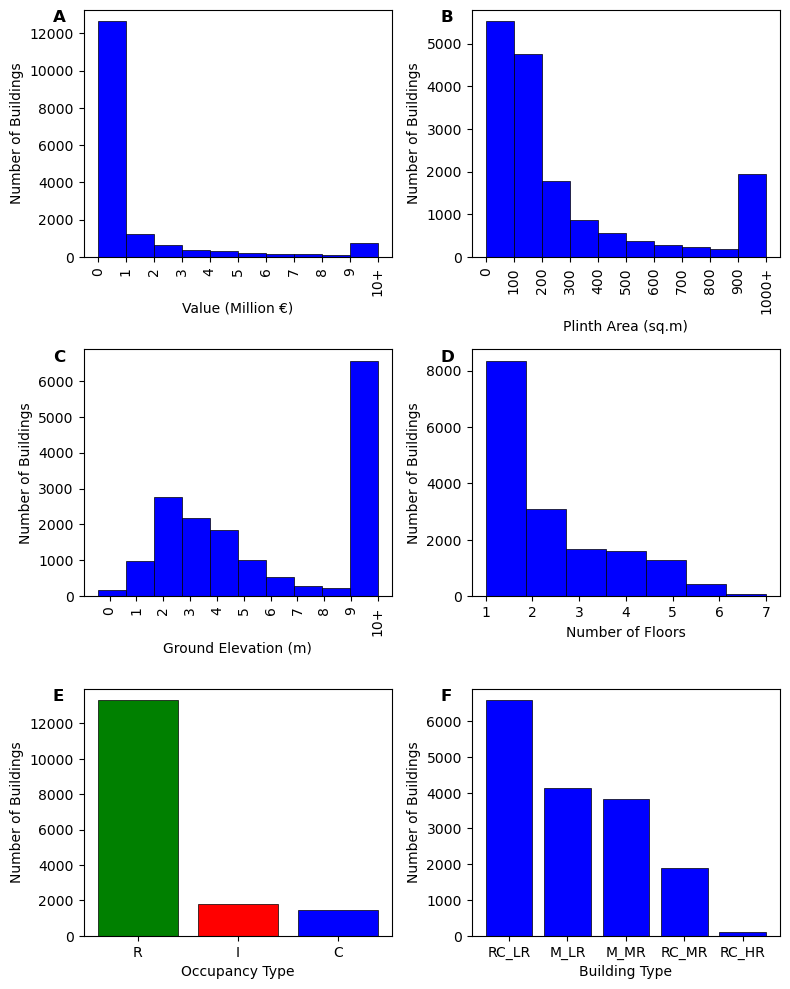

In [3]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt

#create one plot with all the histograms
fig, ax = plt.subplots(3,2,figsize=(8,10))
#read geopackage file with building polygons
MLDir = os.getenv('MLDir')
file_path = f'{MLDir}/risk/exposure/CT_Building_Footprint.gpkg'
buildings_exposure = gpd.read_file(file_path, layer='Building_ExposureInfo')
buildings_exposure['Value'] = buildings_exposure['Value']/1e6
buildings_exposure['Value'][buildings_exposure['Value'] > 10] = 10
ax[0,0].text(-0.1,0.95,'A',transform=ax[0,0].transAxes,fontsize=12,weight="bold")
ax[0,0].hist(buildings_exposure['Value'],bins=10,color='blue',edgecolor='black', linewidth=0.5)
ax[0,0].set_ylabel('Number of Buildings')
ax[0,0].set_xlabel('Value (Million €)')
ax[0,0].set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax[0,0].set_xticklabels(['0','1','2','3','4','5','6','7','8','9','10+'],rotation=90)

buildings_exposure['PlinthArea'][buildings_exposure['PlinthArea'] > 1000] = 1000
ax[0,1].text(-0.1,0.95,'B',transform=ax[0,1].transAxes,fontsize=12,weight="bold")
ax[0,1].hist(buildings_exposure['PlinthArea'],bins=10,color='blue',edgecolor='black', linewidth=0.5)
ax[0,1].set_ylabel('Number of Buildings')
ax[0,1].set_xlabel('Plinth Area (sq.m)')
ax[0,1].set_xticks([0,100,200,300,400,500,600,700,800,900,1000])
ax[0,1].set_xticklabels(['0','100','200','300','400','500','600','700','800','900','1000+'],rotation=90)

buildings_exposure['Elevation'][buildings_exposure['Elevation'] > 10] = 10
ax[1,0].text(-0.1,0.95,'C',transform=ax[1,0].transAxes,fontsize=12,weight="bold")
ax[1,0].hist(buildings_exposure['Elevation'],bins=10,color='blue',edgecolor='black', linewidth=0.5)
ax[1,0].set_ylabel('Number of Buildings')
ax[1,0].set_xlabel('Ground Elevation (m)')
ax[1,0].set_xticks([0,1,2,3,4,5,6,7,8,9,10])
ax[1,0].set_xticklabels(['0','1','2','3','4','5','6','7','8','9','10+'],rotation=90)

buildings_exposure['nFloors'][buildings_exposure['nFloors'] > 6 ] = 7
ax[1,1].text(-0.1,0.95,'D',transform=ax[1,1].transAxes,fontsize=12,weight="bold")
ax[1,1].hist(buildings_exposure['nFloors'].loc[buildings_exposure['nFloors'] > 0],bins=7,color='blue',edgecolor='black', linewidth=0.5)
ax[1,1].set_ylabel('Number of Buildings')
ax[1,1].set_xlabel('Number of Floors')

Occupancy_type = buildings_exposure['Occupancy'].value_counts().index
Occupancy_counts = buildings_exposure['Occupancy'].value_counts().values
ax[2,0].text(-0.1,0.95,'E',transform=ax[2,0].transAxes,fontsize=12,weight="bold")
ax[2,0].bar(Occupancy_type, Occupancy_counts, color=['green', 'red', 'blue'],edgecolor='black', linewidth=0.5)
ax[2,0].set_ylabel('Number of Buildings')
ax[2,0].set_xlabel('Occupancy Type')
ax[2,0].set_xticklabels(['R','I','C'])

Building_type = buildings_exposure['Building_Class'].value_counts().index
Building_counts = buildings_exposure['Building_Class'].value_counts().values
ax[2,1].text(-0.1,0.95,'F',transform=ax[2,1].transAxes,fontsize=12,weight="bold")
ax[2,1].bar(Building_type, Building_counts, color='blue',edgecolor='black', linewidth=0.5)
ax[2,1].set_ylabel('Number of Buildings')
ax[2,1].set_xlabel('Building Type')

fig.tight_layout()
fig.savefig(f'{MLDir}/risk/plots/Histogram_Buildings.png')

Plot Vulnerability Functions for the two construction materials

['/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/vulnerability/Vul_RC_LR.txt', '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/vulnerability/Vul_RC_MR.txt', '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/vulnerability/Vul_M_MR.txt', '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/vulnerability/Vul_M_LR.txt', '/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/vulnerability/Vul_RC_HR.txt']


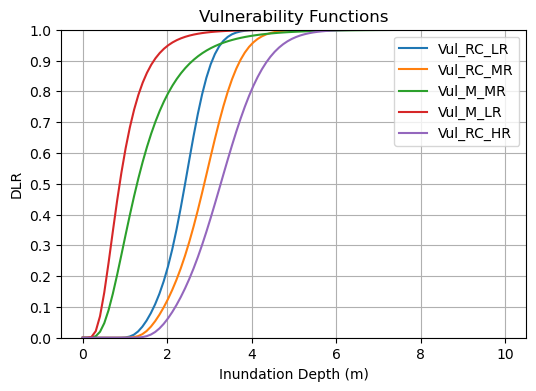

In [1]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt

# list txt files in the current directory
txt_files = glob.glob('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/vulnerability/*.txt')
print(txt_files)

# plot the vulnerability functions
plt.figure(figsize=(6, 4))
for file in txt_files:
    data = np.loadtxt(file, delimiter=',', skiprows=1)
    file = os.path.basename(file)
    plt.plot(data[:,0], data[:,1], label=file.split('.')[0])
plt.xlabel('Inundation Depth (m)')
plt.ylabel('DLR')
plt.title('Vulnerability Functions')
plt.legend()
plt.grid(True)
plt.yticks(np.arange(0, 1.1, 0.1))
plt.xticks(np.arange(0, 11, 2))
plt.ylim([0, 1])
plt.show()

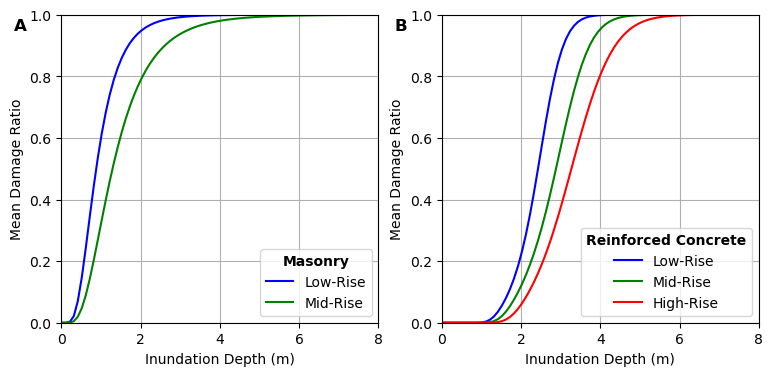

In [5]:
rc_files = [txt_files[0], txt_files[1], txt_files[4]]
m_files = [txt_files[3], txt_files[2]]

# plot the vulnerability functions

#RC buildings
colors = ['blue', 'green', 'red']
fig, ax = plt.subplots(1,2,figsize=(9,4))
labels = ['Low-Rise', 'Mid-Rise', 'High-Rise']
for i,file in enumerate(rc_files):
    data = np.loadtxt(file, delimiter=',', skiprows=1)
    file = os.path.basename(file)
    ax[1].plot(data[:,0], data[:,1], label=labels[i], color=colors[i])
    ax[1].legend(title = 'Reinforced Concrete', loc='lower right',title_fontproperties={'weight':'bold'})

for i,file in enumerate(m_files):
    data = np.loadtxt(file, delimiter=',', skiprows=1)
    file = os.path.basename(file)
    ax[0].plot(data[:,0], data[:,1], label=labels[i], color=colors[i])
    ax[0].legend(title = 'Masonry', loc='lower right',title_fontproperties={'weight':'bold'})

ax[0].text(-0.15,0.95,'A',transform=ax[0].transAxes,fontsize=12,weight="bold")
ax[1].text(-0.15,0.95,'B',transform=ax[1].transAxes,fontsize=12,weight="bold")

for ax_ in ax:
    ax_.set_xlabel('Inundation Depth (m)')
    ax_.set_ylabel('Mean Damage Ratio')
    ax_.grid(True)
    ax_.set_ylim([0, 1])
    ax_.set_xlim([0, 8])

plt.savefig('/mnt/beegfs/nragu/tsunami/ML4SicilyTsunami/risk/plots/Vulnerability_Functions.png')